# EDA for NYC Crime Data


### DSCI 521

### Author: Ao Wang

<img src="https://cdn.homedit.com/wp-content/uploads/tallest-building-nyc/Tallest-Buildings-In-NYC.jpeg">


## Inquiries
1. How has NYC crime rates been over the years? Has it been increasing, decreasing, or stagnant? Are we able to predict crime rates? Perhaps linear regression or SARIMA model? 
    
2. Is there any external factors on crime rate? After analyzing and plotting the data, there seems to be some seasonality. Perhaps there's a correlation between temperature/weather and crime rates. There's less crime during the winter months and more crime during the summer months. Perhaps precipitation and snow fall would also have some effect

3. Given the Borough or Police Precinct, what's the most common types of crime? And what're the frequencies for crimes to occur (monthly, daily, weekly, and hourly). Additionally, how fast are crimes being reported and how long do crimes take to occur?


## Import Libraries

In [1]:
import datetime as dt
import warnings
from os.path import join
from typing import List
from typing import Tuple

import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import pmdarima as pm
from plotly.subplots import make_subplots
from pyspark import SparkConf, SparkContext
from pyspark.sql import SparkSession
from pyspark.sql.dataframe import DataFrame as PySparkDataFrame
from pyspark.sql.functions import (
    col,
    year,
    month,
    dayofmonth,
    hour
)
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.seasonal import DecomposeResult, seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller

warnings.filterwarnings("ignore")
pio.renderers.default = "iframe"

In [2]:
def initializeSpark() -> Tuple[SparkSession, SparkContext]:
    """Create a Spark Session for Streamlit app"""
    conf = SparkConf().setAppName("crime-processor").setMaster("local")
    spark = SparkSession.builder.config(conf=conf).getOrCreate()
    return spark, spark.sparkContext

In [3]:
spark, _ = initializeSpark()

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


23/03/12 01:00:34 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [4]:
processedSDF = spark.read.load(path=join("..", "data", "NYPD_Complaint_Data_Historic.parquet"), format="parquet")
processedSDF.limit(5).toPandas()

,CMPLNT_NUM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,PD_DESC,CRM_ATPT_CPTD_CD,LAW_CAT_CD,BORO_NM,...,SUSP_RACE,SUSP_SEX,LATITUDE,LONGITUDE,PATROL_BORO,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,CMPLNT_TO,CMPLNT_FR
0,506547392,32,2018-03-30 00:00:00,351,CRIMINAL MISCHIEF,254,"MISCHIEF, CRIMINAL 4, OF MOTOR",COMPLETED,MISDEMEANOR,MANHATTAN,...,None,None,40.810877,-73.941064,PATROL BORO MAN NORTH,25-44,WHITE,F,None,2018-03-29 20:30:00
1,629632833,52,2018-02-07 00:00:00,341,PETIT LARCENY,333,"LARCENY,PETIT FROM STORE-SHOPL",COMPLETED,MISDEMEANOR,BRONX,...,BLACK,F,40.873671,-73.908014,PATROL BORO BRONX,UNKNOWN,UNKNOWN,D,None,2018-02-06 23:15:00
2,787203902,75,2018-11-21 00:00:00,341,PETIT LARCENY,321,"LARCENY,PETIT FROM AUTO",COMPLETED,MISDEMEANOR,BROOKLYN,...,WHITE HISPANIC,F,40.651782,-73.885457,PATROL BORO BKLYN NORTH,UNKNOWN,UNKNOWN,D,2018-11-21 00:20:00,2018-11-21 00:15:00
3,280364018,10,2018-06-10 00:00:00,361,OFFENSES AGAINST PUBLIC ORDER/ADMINISTRATION,639,AGGRAVATED HARASSMENT 2,COMPLETED,MISDEMEANOR,MANHATTAN,...,WHITE HISPANIC,M,40.759310,-73.994706,PATROL BORO MAN SOUTH,18-24,WHITE HISPANIC,F,2018-06-09 21:43:00,2018-06-09 21:42:00
4,985800320,19,2018-11-10 00:00:00,341,PETIT LARCENY,333,"LARCENY,PETIT FROM STORE-SHOPL",COMPLETED,MISDEMEANOR,MANHATTAN,...,BLACK HISPANIC,F,40.764536,-73.970728,PATROL BORO MAN NORTH,UNKNOWN,UNKNOWN,D,2018-11-10 19:45:00,2018-11-10 19:40:00


In [5]:
processedSDF.printSchema()

root
 |-- CMPLNT_NUM: integer (nullable = true)
 |-- ADDR_PCT_CD: integer (nullable = true)
 |-- RPT_DT: string (nullable = true)
 |-- KY_CD: integer (nullable = true)
 |-- OFNS_DESC: string (nullable = true)
 |-- PD_CD: integer (nullable = true)
 |-- PD_DESC: string (nullable = true)
 |-- CRM_ATPT_CPTD_CD: string (nullable = true)
 |-- LAW_CAT_CD: string (nullable = true)
 |-- BORO_NM: string (nullable = true)
 |-- LOC_OF_OCCUR_DESC: string (nullable = true)
 |-- PREM_TYP_DESC: string (nullable = true)
 |-- JURIS_DESC: string (nullable = true)
 |-- JURISDICTION_CODE: integer (nullable = true)
 |-- SUSP_AGE_GROUP: string (nullable = true)
 |-- SUSP_RACE: string (nullable = true)
 |-- SUSP_SEX: string (nullable = true)
 |-- LATITUDE: double (nullable = true)
 |-- LONGITUDE: double (nullable = true)
 |-- PATROL_BORO: string (nullable = true)
 |-- VIC_AGE_GROUP: string (nullable = true)
 |-- VIC_RACE: string (nullable = true)
 |-- VIC_SEX: string (nullable = true)
 |-- CMPLNT_TO: string (

## Crime Occurences
Lets group the crimes by months and years to see if there's an uptrend or downtrend in crime. Additionally, it'll be interesting to see if there're any noticiable patterns.

In [6]:
def getCrimesPerMonth(sdf: PySparkDataFrame) -> pd.DataFrame:
    crimeTimes = sdf.select(
        year("CMPLNT_FR").alias("CMPLNT_FR_YEAR"),
        month("CMPLNT_FR").alias("CMPLNT_FR_MONTH"),
        dayofmonth("CMPLNT_FR").alias("CMPLNT_FR_DAY"),
        hour("CMPLNT_FR").alias("CMPLNT_FR_HOUR")
    ).cache()

    crimesPerMonth = crimeTimes.groupBy(["CMPLNT_FR_YEAR", "CMPLNT_FR_MONTH"]).count().sort(
        [col("CMPLNT_FR_YEAR"), col("CMPLNT_FR_MONTH")]
    ).toPandas()

    crimesPerMonth["Date"] = crimesPerMonth.CMPLNT_FR_MONTH.map(str) + "/" + crimesPerMonth.CMPLNT_FR_YEAR.map(str)
    crimesPerMonth.Date = pd.to_datetime(crimesPerMonth.Date)
    crimesPerMonth.set_index("Date", inplace=True)
    crimesPerMonth.drop(columns=["CMPLNT_FR_YEAR", "CMPLNT_FR_MONTH"], inplace=True)
    return crimesPerMonth

In [7]:
crimesPerMonth = getCrimesPerMonth(processedSDF)

In [8]:
crimesPerYear = crimesPerMonth.groupby(crimesPerMonth.index.year).sum()

## Yearly Trend
* It looks like crime was going down since 2006, though there does seem to be a spike at the start of 2020. Perhaps the COVID-19 pandemic had an effect on crime rates. Let's see if we're able to predict future crime rates.

In [9]:
yearly = px.line(crimesPerYear, x=crimesPerYear.index, y="count")
yearly.show()

## Monthly Data
* Let's peek at a smaller granuarity for crime rates. Here we see that it goes up and down a lot, a seasonality. I'll try with a simple linear regression model to predict crime rates. 

In [10]:
monthly = px.line(crimesPerMonth, x=crimesPerMonth.index, y="count")
monthly.show()

In [11]:
def createLinearRegressionModel(crimeData: pd.DataFrame):
    # Create linear regression object
    regr = linear_model.LinearRegression()

    # Train the model using the training sets
    regr.fit(crimeData.index.values.reshape(-1, 1), crimeData["count"])
    return regr

In [12]:
regr = createLinearRegressionModel(crimeData=crimesPerMonth)

### How Accurate is the Linear Regression?
* The MSE (Mean Squared Error) evaluates the accuracy of the model's prediction. It's the average squared difference between the predicted and actual values. A low MSE would mean that the model is accurately predicting the outcome. However, a high MSE would show poor accuracy. The result below shows MSE of 11114480.57, which is really high, proving that perhaps a linear regression may not be the best for crime predictions.

* Additionally, the R-squared score or coefficient of determination also evaluates the performance of the model. It ranges from 0 to 1, where 0 shows that the model doesn't fit the data well and 1 shows the moel does fit well. And we have an R-squared score of 0.31, which is low.

In [13]:
def getLinearRegressionMetrics(regr, crimeData):
    predicted = regr.predict(crimeData.index.values.reshape(-1, 1).astype("float64"))
    mse = mean_squared_error(crimeData['count'], predicted)
    r2Score = r2_score(crimeData['count'], predicted)
    return regr.coef_, mse, r2Score

In [14]:
coef, mse, r2Score = getLinearRegressionMetrics(regr=regr, crimeData=crimesPerMonth)

In [15]:
print(
    f"Coefficients: {coef[0]}\n"
    f"Mean squared error: {mse:.2f}\n"
    f"Root mean squared error: {np.sqrt(mse):.2f}\n"
    f"Coefficient of determination: {r2Score:.2f}"
)

Coefficients: -1.5315037243335902e-14
Mean squared error: 11114480.57
Root mean squared error: 3333.84
Coefficient of determination: 0.31


In [16]:
fig = px.scatter(
    x=crimesPerMonth.index,
    y=crimesPerMonth["count"],
    trendline="ols",
    title="Crimes per Month - Linear Regression"
)

In [17]:
fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Count",
)

In [18]:
predicted = regr.predict(crimesPerMonth.index.values.reshape(-1, 1).astype("float64"))

In [19]:
residual = crimesPerMonth["count"].values - predicted

It looks like there's no disscernable pattern, which is good for a residual plot. But if you look back at the previous plot, we see that the scatter plot still looks similar, but it no longer has a downtrend. 


In [20]:
px.scatter(
    x=crimesPerMonth.index,
    y=residual,
    title="Crimes per Month - Residual"
)

## Decompose the Crime Data Time Series
* Since linear regression didn't work so well. I wanted to try using a SARIMA (Seasonal Autoregressive Integrated Moving Average) model. It's a popular time series forecasting model and it's able to capture the trend and seasonal patterns in the data.

In [21]:
multiplicative_decomposition = seasonal_decompose(
    crimesPerMonth["count"],
    model="multiplicative",
    extrapolate_trend="freq"
)

In [22]:
def plot_seasonal_decompose(
        result: DecomposeResult,
        dates: pd.Series = None,
        title: str = "Seasonal Decomposition"
):
    x_values = dates if dates is not None else np.arange(len(result.observed))
    return (
        make_subplots(
            rows=4,
            cols=1,
            subplot_titles=["Observed", "Trend", "Seasonal", "Residuals"],
        )
            .add_trace(
            go.Scatter(x=x_values, y=result.observed, mode="lines", name="Observed"),
            row=1,
            col=1,
        )
            .add_trace(
            go.Scatter(x=x_values, y=result.trend, mode="lines", name="Trend"),
            row=2,
            col=1,
        )
            .add_trace(
            go.Scatter(x=x_values, y=result.seasonal, mode="lines", name="Seasonal"),
            row=3,
            col=1,
        )
            .add_trace(
            go.Scatter(x=x_values, y=result.resid, mode="markers", name="Residual"),
            row=4,
            col=1,
        )
            .update_layout(
            height=1000, width=1000, title=f"<b>{title}</b>", title_x=0.5, showlegend=False
        )
    )

* We can see that the decomposition separates the time series data into three parts: the trend, seasonality, and residual. From the linear regression and just from looking at the observed data, we know that the trend is correct - crime rates are lowering throughout the year

* Additionally there does seem to be a strong seasonlity pattern, every 12 months. And the residual shows no pattern, so it's good that we did a multiplicative decomposition and not an additive one.

In [23]:
plot_seasonal_decompose(multiplicative_decomposition, dates=crimesPerMonth.index)

##  Stationarity 
The purpose of differencing it to make the time series stationary. The right order of differencing is the minimum differencing required to get a near-stationary series. This allows the ACF plot reaches to zero fairly quick and creates an accurate model. We can test for stationarity with ADF, Augmented Dickey Fuller, test.

### Augmented Dickey Fuller
* The null hypothesis of the ADF test is that the time series is non-stationary. So, if the p-value of the test is less than the significance level (0.05) then you reject the null hypothesis and infer that the time series is stationary.

* First, I am going to check if the series is stationary using the Augmented Dickey Fuller test from the statsmodels package. You only need to apply differencing when the series is non-stationary.

* So, in our case, if P Value > 0.05 we go ahead with finding the order of differencing. We see that the p-value is 0.74, which means we have to let the model know there need one-level of differencing to make the data stationary.

In [24]:
# ADF Test
result = adfuller(crimesPerMonth["count"].dropna().values, autolag="AIC")
print(
    f"ADF Statistic: {result[0]}\n"
    f"n_lags: {result[1]}\n"
    f"p-value: {result[1]}\n"
)
for key, value in result[4].items():
    print("Critial Values:")
    print(f"\t{key}: {value}")

ADF Statistic: -1.0239255367106468
n_lags: 0.7444383061447173
p-value: 0.7444383061447173

Critial Values:
	1%: -3.467845319799907
Critial Values:
	5%: -2.878011745497439
Critial Values:
	10%: -2.575551186759871


## SARIMA Model

In [25]:
# Use 80% of the data for training
train_size = int(len(crimesPerMonth) * 0.8)
train = crimesPerMonth.iloc[:train_size]
test = crimesPerMonth.iloc[train_size:]

In [26]:
def createSARIMAModel(data: pd.DataFrame) -> SARIMAX:
    model = pm.auto_arima(
        data,
        test="adf",
        information_criterion="aic",
        trace=True,
        m=12,
        D=1,
        d=1,
        error_action="ignore"
    )
    parameters = model.get_params()
    print(parameters)
    model_fit = SARIMAX(
        data,
        order=parameters["order"],
        seasonal_order=parameters["seasonal_order"],
    ).fit(disp=-1)
    return model_fit

In [27]:
model_fit = createSARIMAModel(train)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=2532.788, Time=1.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=2587.334, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=2559.972, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=2545.256, Time=0.34 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=2538.419, Time=0.79 sec
 ARIMA(2,1,2)(1,1,0)[12]             : AIC=2560.177, Time=0.37 sec
 ARIMA(2,1,2)(2,1,1)[12]             : AIC=2537.955, Time=1.50 sec
 ARIMA(2,1,2)(1,1,2)[12]             : AIC=2538.202, Time=1.59 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(2,1,2)(0,1,2)[12]             : AIC=2532.839, Time=1.83 sec
 ARIMA(2,1,2)(2,1,0)[12]             : AIC=2542.038, Time=2.26 sec
 ARIMA(2,1,2)(2,1,2)[12]             : AIC=2538.299, Time=2.52 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=2538.122, Time=0.84 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=2537.049, Time=0.69 sec
 ARIMA(3,1,2)(1,1,1)[12]

In [28]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                count   No. Observations:                  153
Model:             SARIMAX(4, 1, 0)x(1, 1, [1], 12)   Log Likelihood               -1253.786
Date:                              Sun, 12 Mar 2023   AIC                           2521.571
Time:                                      01:01:34   BIC                           2542.163
Sample:                                  01-01-2006   HQIC                          2529.939
                                       - 09-01-2018                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0971      0.028     -3.516      0.000      -0.151      -0.043
ar.L2         -0.1336      0.070     -1.914      0.056      -0.270       0.003
ar.L3         -0.2309      0.031     -7.473      0.000      -0.291      -0.170
ar.L4          0.1119      0.033      3.396      0.001       0.047       0.177
ar.S.L12       0.3444      0.072      4.815      0.000       0.204       0.485
ma.S.L12      -0.7378      0.092     -8.008      0.000      -0.918      -0.557
sigma2      3.492e+06    4.1e+05      8.521      0.000    2.69e+06    4.29e+06
===================================================================================
Ljung-Box (L1) (Q):                   9.62   Jarque-Bera (JB):                 4.69
Prob(Q):                              0.00   Prob(JB):                         0.10
Heteroskedasticity (H):               0.27   Skew:                            -0.24
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.76
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Diagnostics
* Showing the diagnostics ensures that the residuals of the model is uncorrelated and normally distributed with mean 0. If the SARIMA model doesn't satisfy those requirements, then it needs further improvement. But we do see that below.
* The standardized residual on the top left shows the mean around 0 and shows no obvious signs of seasonality.
* Additionally, the top right plot with the red KDE follows closely the normal distribution N($\mu$=0,$\sigma$=1). As well at the QQ-plot followin the linear trend of the samples taken from the normal distribution.

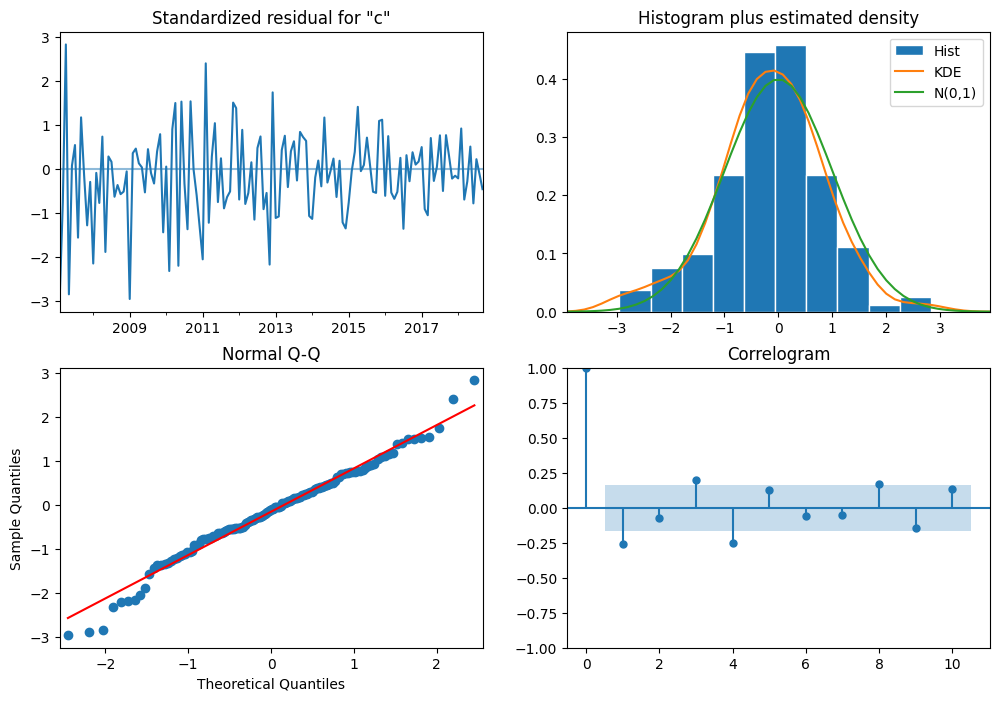

In [29]:
model_fit.plot_diagnostics(figsize=(12, 8))
plt.show()

## Plotting Prediction
* Compared to the linear regression model, we see that SARIMA accurately follows the trend and seasonality of NYC crime rates

In [30]:
def createPredictedPlot(model, months: int = 12 * 4):
    yPred = model.forecast(months)
    fig = go.Figure()

    fig.add_traces(
        go.Scatter(
            x=crimesPerMonth.index,
            y=crimesPerMonth["count"],
            name="Observed",
            hovertemplate="Month: %{x}<br>"
                          "Count: %{y}<br>"
                          "<extra></extra>"
        )
    )

    fig.add_traces(
        go.Scatter(
            x=yPred.index,
            y=yPred,
            mode="lines",
            name="Predicted",
            hovertemplate="Month: %{x}<br>"
                          "Count: %{y}<br>"
                          "<extra></extra>"
        )
    )
    fig.update_layout(
        title="Monthly Crime Rate with SARIMA",
        xaxis_title="Month",
        yaxis_title="Count",
    )
    return fig

In [31]:
createPredictedPlot(model=model_fit)

## Error
* MAPE measures the average absolute percentage difference between the predicted values and the actual values. It shows the average percentage difference between the predicted and actual values. In our case 6.3%, which is relatively low, meaning our model is accurate. At least much more accurate than the linear regression.

* RMSE measures the square root of the average of the squared differences between the predicted values and the actual values. It shows the magnitude of the errors in your predictions, and it gives more weight to large errors compared to smaller errors.

In [32]:
def calculateError(model, test) -> Tuple[float, float]:
    predictions = model.forecast(len(test))
    predictions = pd.Series(predictions, index=test.index)
    residuals = test["count"] - predictions
    mape = np.mean(abs(residuals / test["count"])) * 100
    rmse = np.sqrt(np.mean(residuals ** 2))
    return mape, rmse

In [33]:
mape, rsme = calculateError(model=model_fit, test=test)

In [34]:
print(f"Mean Absolute Percent Error: {mape:.4f}")

Mean Absolute Percent Error: 6.3942


In [35]:
print(f"Root Mean Squared Error: {rsme:.2f}")

Root Mean Squared Error: 3076.61


## Map Vizualizations
* Boroughs
* NYPD Precincts

In [36]:
def createNYCMap() -> folium.folium.Map:
    # Central lat/long values of NYC
    nycCoordinates = [40.72, -73.9999]
    zoom = 10

    # instatiate a folium map object with the above coordinate at center
    nycCrimeMap = folium.Map(
        location=nycCoordinates,
        zoom_start=zoom
    )
    return nycCrimeMap

## Chloropleth
* A chloropleth map is a type of thematic map that uses color-coded areas to represent different values or data in different regions or areas.
* Chloropleth maps are useful for showing patterns and trends in data across geographic regions. They can be used to display a wide range of data, such as population density, per capita income, election results, or any other data that can be aggregated at the regional or state level. In our case, I would use geojson files to create regions by borough and precincts and discovering the crime rates in each area.

In [37]:
def createChloropleth(
        map_: folium.folium.Map,
        geoData: gpd.geodataframe.GeoDataFrame,
        columns: List[str],
        keyOn: str,
) -> folium.folium.Map:
    style_function = lambda x: {
        "fillColor": "#ffffff",
        "color": "#000000",
        "fillOpacity": 0.1,
        "weight": 0.1
    }

    highlight_function = lambda x: {
        "fillColor": "#000000",
        "color": "#000000",
        "fillOpacity": 0.50,
        "weight": 0.1
    }
    folium.Choropleth(
        geo_data=geoData,
        data=geoData,
        columns=columns,
        key_on=keyOn,
        fill_color="YlOrRd",
        fill_opacity=0.7,
        line_opacity=.1,
    ).add_to(map_)

    folium.features.GeoJson(
        geoData,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.features.GeoJsonTooltip(
            fields=columns,
            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
        )
    ).add_to(map_)

    return map_

## Analyzing by Borough
* We see that crime in 2021, Brooklyn and Manhattan have the most amount of crime with Staten Island having the least.

In [38]:
def createBoroughMap(sdf: PySparkDataFrame, choosenYear: int) -> folium.folium.Map:
    map_ = createNYCMap()

    boroughCrimeCountPerYear = sdf.select("BORO_NM", year("CMPLNT_FR").alias("year")).groupby(
        ["BORO_NM", "year"]).count().cache().toPandas()

    yearCrimeCount = boroughCrimeCountPerYear[boroughCrimeCountPerYear.year == choosenYear].drop(columns=["year"])
    yearCrimeCount.BORO_NM = yearCrimeCount.BORO_NM.str.title()

    boroughGeoJson = gpd.read_file(join("..", "geojson", "Borough Boundaries.geojson"))
    boroughDF = boroughGeoJson.merge(yearCrimeCount, left_on="boro_name", right_on="BORO_NM", how="left")
    return createChloropleth(
        map_=map_,
        geoData=boroughDF,
        columns=["boro_name", "count"],
        keyOn="feature.properties.boro_name"
    )

In [39]:
boroughMap2021 = createBoroughMap(processedSDF, 2021)

In [40]:
boroughMap2021

In [41]:
def getBoroughData(
        sdf: PySparkDataFrame,
        borough: str = "BROOKLYN",
        choosenYear: int = 2021
) -> pd.DataFrame:
    boroughColumns = ["BORO_NM", "CMPLNT_FR", "CMPLNT_TO", "RPT_DT", "OFNS_DESC", "PD_DESC", "LAW_CAT_CD"]
    boroughCrimes = sdf.select(boroughColumns).filter(
        (year("CMPLNT_FR") == choosenYear) & (col("BORO_NM") == borough)).cache().toPandas()

    boroughCrimes.CMPLNT_FR = pd.to_datetime(boroughCrimes.CMPLNT_FR)
    boroughCrimes.CMPLNT_TO = pd.to_datetime(boroughCrimes.CMPLNT_TO)
    boroughCrimes.RPT_DT = pd.to_datetime(boroughCrimes.RPT_DT) + dt.timedelta(hours=23, minutes=59, seconds=59)
    boroughCrimes["CRIME_DURATION"] = boroughCrimes.CMPLNT_TO - boroughCrimes.CMPLNT_FR
    boroughCrimes["REPORT_LATENCY"] = boroughCrimes.RPT_DT - boroughCrimes.CMPLNT_FR
    return boroughCrimes

In [42]:
brooklynCrimes2021 = getBoroughData(sdf=processedSDF)

In [43]:
brooklynCrimes2021.head()

,BORO_NM,CMPLNT_FR,CMPLNT_TO,RPT_DT,OFNS_DESC,PD_DESC,LAW_CAT_CD,CRIME_DURATION,REPORT_LATENCY
0,BROOKLYN,2021-12-21 18:30:00,2021-12-22 07:45:00,2021-12-22 23:59:59,PETIT LARCENY,"LARCENY,PETIT OF VEHICLE ACCES",MISDEMEANOR,0 days 13:15:00,1 days 05:29:59
1,BROOKLYN,2021-12-26 23:00:00,2021-12-27 07:00:00,2021-12-27 23:59:59,BURGLARY,"BURGLARY,RESIDENCE,NIGHT",FELONY,0 days 08:00:00,1 days 00:59:59
2,BROOKLYN,2021-12-07 10:05:00,2021-12-07 10:11:00,2021-12-07 23:59:59,FELONY ASSAULT,"ASSAULT 2,1,UNCLASSIFIED",FELONY,0 days 00:06:00,0 days 13:54:59
3,BROOKLYN,2021-11-24 08:00:00,NaT,2021-11-29 23:59:59,FRAUDS,"FRAUD,UNCLASSIFIED-MISDEMEANOR",MISDEMEANOR,NaT,5 days 15:59:59
4,BROOKLYN,2021-12-03 00:01:00,NaT,2021-12-03 23:59:59,PETIT LARCENY,"LARCENY,PETIT FROM OPEN AREAS,",MISDEMEANOR,NaT,0 days 23:58:59


## What are the Most Common Crimes?
* The function finds the top crimes in a borough or precinct.
* We see that in Brooklyn 2021 that petit larceny (thefts where the value of the property taken is low) is the most common, followed by harassment.
* Robbery is a more serious offense than petit larceny, and involves the use of force, intimidation, or threat of force to take property from another person. 
* Unlike petit larceny, which may involve stealing property when the owner is not present or aware of the theft, robbery involves taking property directly from another person or in their presence.

In [44]:
def getTopNCrimePlot(df: pd.DataFrame, n: int = 10):
    try:
        title = f"Top {n} Crimes in {df.BORO_NM.iloc[0].title()}"
    except Exception:
        title = f"Top {n} Crimes in Precinct {df.ADDR_PCT_CD.iloc[0]}"

    fig = px.bar(
        df.OFNS_DESC.value_counts()[:n],
        title=title,
    )

    fig.update_layout(
        xaxis_title="Types of Crimes",
        yaxis_title="Crime Count",
        showlegend=False,
    )
    fig.update_traces(
        hovertemplate="<i>Crime: </i> %{x}\n"
                      "<br><i>Count: </i> %{y}"
                      "<extra></extra>"
    )
    return fig

In [45]:
getTopNCrimePlot(brooklynCrimes2021)

In [46]:
def convert_to_am_pm(hour: int) -> str:
    if hour == 0:
        return "12 AM"
    elif 1 <= hour <= 11:
        return f"{hour} AM"
    elif hour == 12:
        return "12 PM"
    else:
        return f"{hour - 12} PM"

In [47]:
brooklynCrimes2021 = getBoroughData(sdf=processedSDF)

23/03/12 01:01:45 WARN CacheManager: Asked to cache already cached data.


## When are Crimes Commited Most?
* Recording Brooklyn 2021:
    * Here we see that there's a decrease in crimes in the winter months, like December, January, and Feburary. I would expect an increase of crimes in the warmer months, but strangely we see that October has the highest count of crime
    * In terms of days in a month, the first day of the month has the highest count of crime. And the 31 has the lowest rate of crime. Though that can just be a factor that some months do not have a 31st day. But generally, near the end of the month seems like there's a decrease of crime.
    * In terms of days in a week, Friday has the highest count of crime while Sunday has the lowest.
    * In terms of hours in a day, crime is highest from 3-6PM and lowest 4AM-6AM.

In [48]:
def crimeFrequencySubplot(df: pd.DataFrame):
    fig = make_subplots(
        rows=2,
        cols=2,
        subplot_titles=("Crimes per Month", "Crimes per Day of Week", "Crimes per Day", "Crimes per Hour")
    )
    weekNameMapping = {
        "Sunday": 0,
        "Monday": 1,
        "Tuesday": 2,
        "Wednesday": 3,
        "Thursday": 4,
        "Friday": 5,
        "Saturday": 6
    }

    df = df.copy(deep=True)
    df["MONTH"] = df.CMPLNT_FR.dt.month
    df["MONTH_NAME"] = df.CMPLNT_FR.dt.month_name()
    df["DAY"] = df.CMPLNT_FR.dt.day
    df["DAY_OF_WEEK"] = df.CMPLNT_FR.dt.day_name()
    df["HOUR"] = df.CMPLNT_FR.dt.hour
    df["COUNT"] = 1

    monthly = df[["MONTH", "MONTH_NAME", "COUNT"]].groupby(["MONTH", "MONTH_NAME"]).sum().reset_index()

    weekly = df.DAY_OF_WEEK.value_counts()
    weekly.index = weekly.index.map(weekNameMapping)
    weekly.sort_index(inplace=True)
    weekly.index = weekly.index.map(
        {value: key for key, value in weekNameMapping.items()}
    )

    daily = df.DAY.value_counts().sort_index()

    hourly = df.HOUR.value_counts().sort_index()
    hourly.index = hourly.index.map(convert_to_am_pm)

    fig.add_trace(
        go.Bar(
            x=monthly.MONTH_NAME,
            y=monthly.COUNT,
            name="Types of Crimes per Month"
        ),
        row=1, col=1
    )

    fig.add_trace(
        go.Bar(
            x=weekly.index,
            y=weekly.values,
            name="Types of Crimes per Day of Week"
        ),
        row=1, col=2
    )

    fig.add_trace(
        go.Bar(
            x=daily.index,
            y=daily.values,
            name="Types of Crimes per Day of Month",

        ),
        row=2, col=1
    )

    fig.add_trace(
        go.Bar(
            x=hourly.index,
            y=hourly.values,
            name="Types of Crimes per Hour"
        ),
        row=2, col=2
    )

    # Update xaxis properties
    fig.update_xaxes(title_text="Month", row=1, col=1)
    fig.update_xaxes(title_text="Day of Week", row=1, col=2)
    fig.update_xaxes(title_text="Days", row=2, col=1)
    fig.update_xaxes(title_text="Hours", row=2, col=2)

    # Update yaxis properties
    fig.update_yaxes(title_text="Count", row=1, col=1)
    fig.update_yaxes(title_text="Count", row=1, col=2)
    fig.update_yaxes(title_text="Count", row=2, col=1)
    fig.update_yaxes(title_text="Count", row=2, col=2)

    # Update hover template
    fig.update_traces(
        hovertemplate="<i>Month: </i> %{x}\n"
                      "<br><i>Count: </i> %{y}"
                      "<extra></extra>",
        row=1,
        col=1
    )
    fig.update_traces(
        hovertemplate="<i>Day of Week: </i> %{x}\n"
                      "<br><i>Count: </i> %{y}"
                      "<extra></extra>",
        row=1,
        col=2
    )
    fig.update_traces(
        hovertemplate="<i>Day: </i> %{x}\n"
                      "<br><i>Count: </i> %{y}"
                      "<extra></extra>",
        row=2,
        col=1
    )
    fig.update_traces(
        hovertemplate="<i>Hour: </i> %{x}\n"
                      "<br><i>Count: </i> %{y}"
                      "<extra></extra>",
        row=2,
        col=2
    )

    fig.update_layout(
        height=800,
        width=1000,
        title_text="Crimes in Different Time Granuarities",
        showlegend=False
    )

    return fig

In [49]:
crimeFrequencySubplot(brooklynCrimes2021)

## How Long it Takes to Report Crime and How Long Crimes Last?
* For Brooklyn 2021:
    * We see that ~97% of the crimes occur from 0-2.5 days. However we see that these crimes can range from a few days to an entire year.
    * In terms of reporting the crimes to the police, there seems to be more of a delay with ~83% of crimes be reported 0-2.5 days.

In [50]:
def crimeDurationAndReportLatency(df: pd.DataFrame):
    fig = make_subplots(
        rows=2,
        cols=1,
        subplot_titles=("Crime Duration", "Report Crime Latency")
    )
    df = df.copy(deep=True)
    df["CRIME_DURATION"] /= np.timedelta64(1, 'D')
    df["REPORT_LATENCY"] /= np.timedelta64(1, 'D')
    df["REPORT_LATENCY"] = df["REPORT_LATENCY"][df["REPORT_LATENCY"] > 0]

    fig.add_trace(
        go.Histogram(
            x=df["CRIME_DURATION"],
            nbinsx=100,
            histnorm="probability",
        ),
        row=1,
        col=1
    )

    fig.add_trace(
        go.Histogram(
            x=df["REPORT_LATENCY"],
            nbinsx=100,
            histnorm="probability",
        ),
        row=2,
        col=1
    )

    # Update xaxis properties
    fig.update_xaxes(title_text="Number of Days", row=1, col=1)
    fig.update_xaxes(title_text="Number of Days", row=2, col=1)

    # Update yaxis properties
    fig.update_yaxes(title_text="Probability", row=1, col=1)
    fig.update_yaxes(title_text="Probability", row=2, col=1)

    # Update hover template
    fig.update_traces(
        hovertemplate="<i>Crime lasted: </i> %{x} days\n"
                      "<br><i>Percentage: </i> %{y}"
                      "<extra></extra>",
        row=1,
        col=1
    )
    fig.update_traces(
        hovertemplate="<i>Reporting took: </i> %{x} days\n"
                      "<br><i>Percentage: </i> %{y}"
                      "<extra></extra>",
        row=2,
        col=1
    )

    fig.update_yaxes(type="log")
    fig.update_layout(
        height=800,
        width=1000,
        showlegend=False
    )

    return fig

In [51]:
crimeDurationAndReportLatency(brooklynCrimes2021)

In [52]:
statenIslandCrimes2021 = getBoroughData(sdf=processedSDF, borough="STATEN ISLAND")

In [53]:
crimeFrequencySubplot(statenIslandCrimes2021)

In [54]:
crimeDurationAndReportLatency(statenIslandCrimes2021)

## Analyzing by NYPD Precinct

In [55]:
def createPrecinctMap(sdf: PySparkDataFrame, choosenYear: int) -> folium.folium.Map:
    map_ = createNYCMap()

    precinctCrimeCountPerYear = sdf.select("ADDR_PCT_CD", year("CMPLNT_FR").alias("year")).groupby(
        ["ADDR_PCT_CD", "year"]).count().cache().toPandas()

    yearCrimeCount = precinctCrimeCountPerYear[precinctCrimeCountPerYear.year == choosenYear].rename(
        columns={"ADDR_PCT_CD": "precinct"}).drop(columns=["year"])

    precinctGeoJson = gpd.read_file(join("..", "geojson", "Police Precincts.geojson"))
    precinctGeoJson.precinct = precinctGeoJson.precinct.astype("Int32")
    precinctDF = precinctGeoJson.merge(yearCrimeCount, on="precinct", how="left")

    return createChloropleth(
        map_=map_,
        geoData=precinctDF,
        columns=["precinct", "count"],
        keyOn="feature.properties.precinct"
    )

In [56]:
precinctMap2021 = createPrecinctMap(sdf=processedSDF, choosenYear=2021)

In [57]:
precinctMap2021

In [58]:
def getPrecinctData(
        sdf: PySparkDataFrame,
        precinct: int = 75,
        choosenYear: int = 2021
) -> pd.DataFrame:
    precinctColumns = ["ADDR_PCT_CD", "CMPLNT_FR", "CMPLNT_TO", "RPT_DT", "OFNS_DESC", "PD_DESC", "LAW_CAT_CD"]
    precinctCrimes = sdf.select(precinctColumns).filter(
        (year("CMPLNT_FR") == choosenYear) & (col("ADDR_PCT_CD") == precinct)).cache().toPandas()

    precinctCrimes.CMPLNT_FR = pd.to_datetime(precinctCrimes.CMPLNT_FR)
    precinctCrimes.CMPLNT_TO = pd.to_datetime(precinctCrimes.CMPLNT_TO)
    precinctCrimes.RPT_DT = pd.to_datetime(precinctCrimes.RPT_DT) + dt.timedelta(hours=23, minutes=59, seconds=59)
    precinctCrimes["CRIME_DURATION"] = precinctCrimes.CMPLNT_TO - precinctCrimes.CMPLNT_FR
    precinctCrimes["REPORT_LATENCY"] = precinctCrimes.RPT_DT - precinctCrimes.CMPLNT_FR
    return precinctCrimes

In [59]:
precinct75 = getPrecinctData(sdf=processedSDF)

In [60]:
crimeFrequencySubplot(precinct75)

In [61]:
crimeDurationAndReportLatency(precinct75)

In [62]:
getTopNCrimePlot(precinct75)